# Rain Prediction Using Logistic Regression


### Weather-AUS Dataset: Variable Definitions

| **Variable**           | **Description**                                                                 |
|------------------------|---------------------------------------------------------------------------------|
| **Date**               | The date of the observation (a Date object)                                     |
| **Location**           | Location name of the weather station                                            |
| **MinTemp**            | Minimum temperature (°C)                                                        |
| **MaxTemp**            | Maximum temperature (°C)                                                        |
| **Rainfall**           | Rainfall amount for the day (mm)                                               |
| **Evaporation**        | Class A pan evaporation over 24 h to 9 am (mm)                                 |
| **Sunshine**           | Hours of bright sunshine during the day                                        |
| **WindGustDir**        | Direction of the strongest wind gust in the 24 h to midnight                   |
| **WindGustSpeed**      | Speed of the strongest wind gust (km/h)                                        |
| **Temp9am**            | Temperature at 9 am (°C)                                                        |
| **RelHumid9am**        | Relative humidity at 9 am (%)                                                  |
| **Cloud9am**           | Cloud cover at 9 am (in “oktas”, eighths of sky; 0 = clear, 8 = overcast)     |
| **WindSpeed9am**       | Wind speed averaged over 10 min before 9 am (km/h)                             |
| **Pressure9am**        | Atmospheric pressure reduced to mean sea level at 9 am (hPa)                  |
| **Temp3pm**            | Temperature at 3 pm (°C)                                                        |
| **RelHumid3pm**        | Relative humidity at 3 pm (%)                                                  |
| **Cloud3pm**           | Cloud cover at 3 pm (in oktas; like Cloud9am)                                  |
| **WindSpeed3pm**       | Wind speed averaged over 10 min before 3 pm (km/h)                            |
| **Pressure3pm**        | Atmospheric pressure reduced to mean sea level at 3 pm (hPa)                  |
| **ChangeTemp**         | Change in temperature (°C) compared to previous measurement                   |
| **ChangeTempDir**      | Direction of temperature change (e.g., "Up", "Down")                          |
| **ChangeTempMag**      | Magnitude of temperature change (°C)                                          |
| **ChangeWindDirect**   | Direction change of the wind                                                  |
| **MaxWindPeriod**      | Period during which maximum wind occurred (time window)                       |
| **RainToday**          | Binary: 1 if rainfall in the 24 h to 9 am > 1 mm, else 0                      |
| **TempRange**          | Difference between MaxTemp and MinTemp (°C)                                   |
| **PressureChange**     | Change in atmospheric pressure (hPa) since the prior measurement              |
| **RISK_MM**            | Rainfall amount for "risk" measure (mm)                                       |
| **RainTomorrow**       | Target variable; indicates whether it rained the next day                     |

The dataset contains over **145,000 rows** and **23 columns**.  
The dataset includes **date**, **numeric**, and **categorical** columns.  

Our objective is to create a model to predict the value in the column **`RainTomorrow`**.

### This model will focus on **Logistic Regression**.

## 1) Setups and imports

In [1]:
import os 
os.chdir('..')

In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

%matplotlib inline
pd.set_option('display.max_columns', None)

In [3]:
raw_df = pd.read_csv('Data/weatherAUS.csv')

## 2) Initial Data Inspection


In [4]:
raw_df.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,W,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,SSE,15.0,11.0,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [6]:
raw_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [7]:
raw_df.isna().sum()


Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [8]:
raw_df.dropna(subset=['RainToday','RainTomorrow'], inplace=True)

In [9]:
raw_df.isna().sum()

Date                 0
Location             0
MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustDir       9163
WindGustSpeed     9105
WindDir9am        9660
WindDir3pm        3670
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
RainTomorrow         0
dtype: int64

In [10]:
if 'Date' in raw_df.columns:
    raw_df['Date'] = pd.to_datetime(raw_df['Date'], errors='coerce')
checks = {}
if 'Rainfall' in raw_df.columns:
    checks['negative_rainfall'] = (raw_df['Rainfall'] < 0).sum()
if 'Evaporation' in raw_df.columns:
    checks['negative_evaporation'] = (raw_df['Evaporation'] < 0).sum()
if 'Date' in raw_df.columns:
    checks['future_dates'] = (raw_df['Date'] > pd.Timestamp.today()).sum()

print("\nIntegrity checks:", checks)


Integrity checks: {'negative_rainfall': 0, 'negative_evaporation': 0, 'future_dates': 0}


## 3) Exploratory Data Analysis

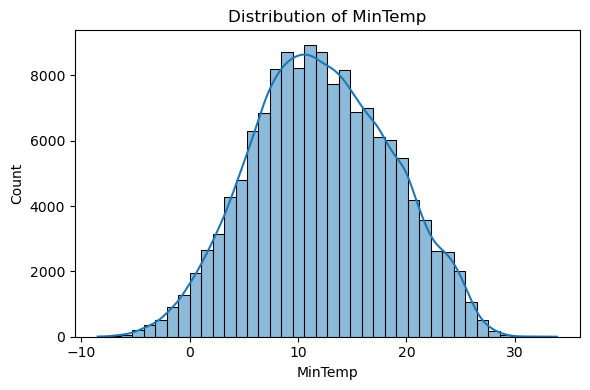

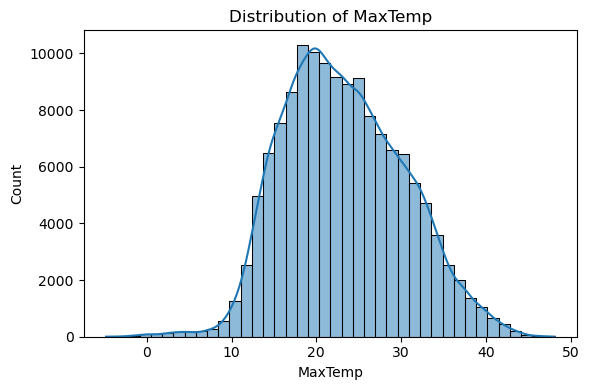

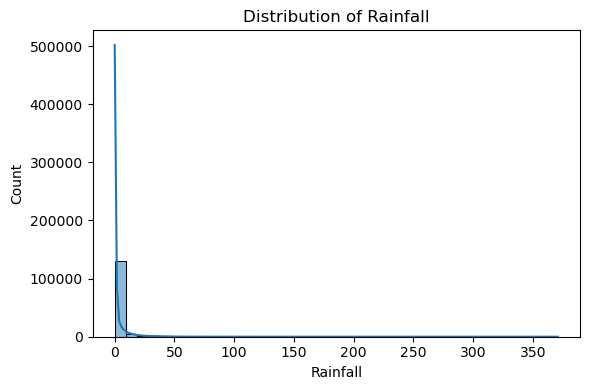

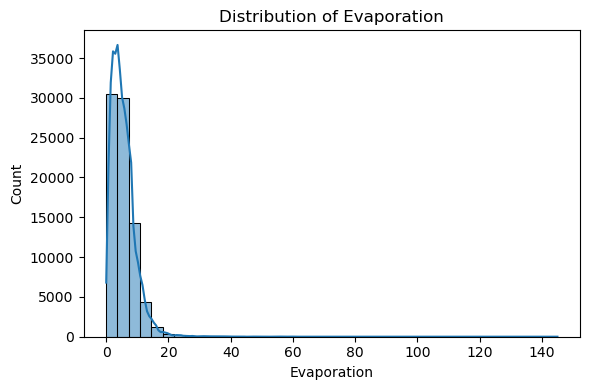

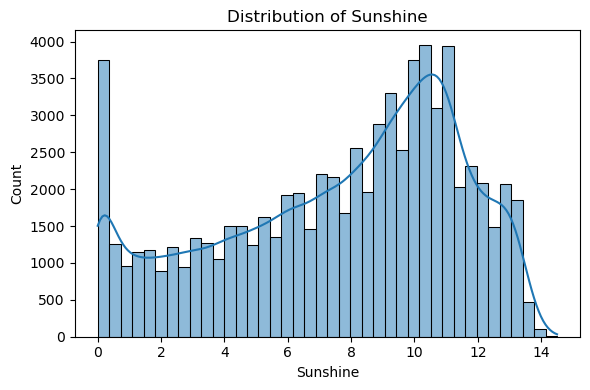

...

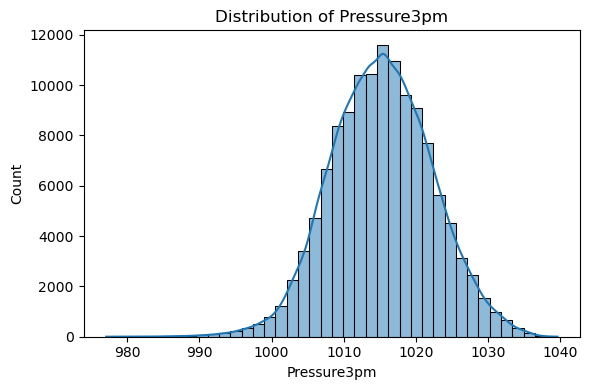

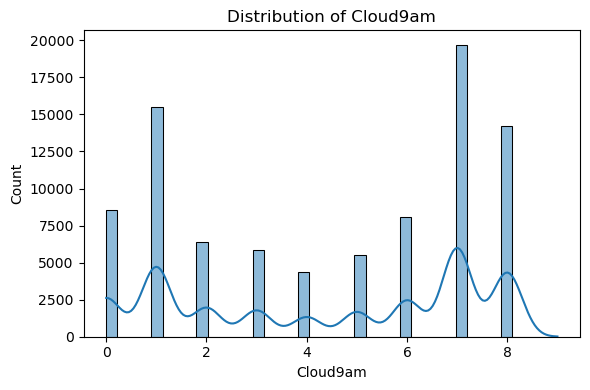

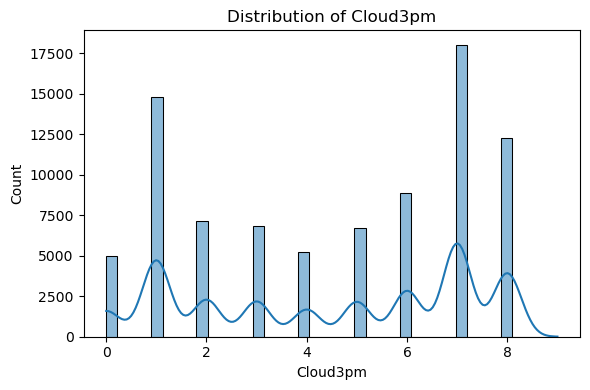

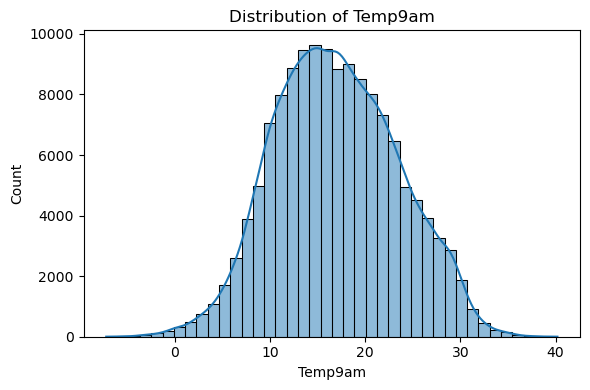

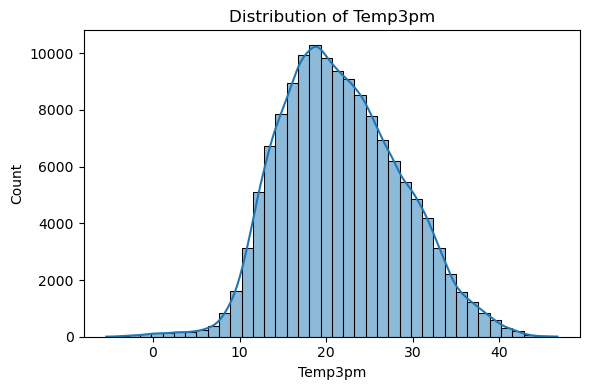

In [11]:
num_cols = raw_df.select_dtypes(include=[np.number]).columns.tolist()
for col in num_cols:  
    plt.figure(figsize=(6,4))
    sns.histplot(raw_df[col], kde=True, bins=40)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()
    plt.show()

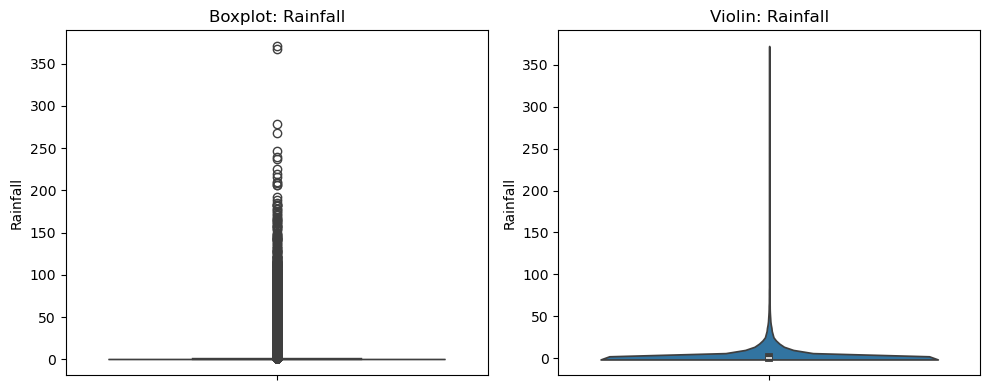

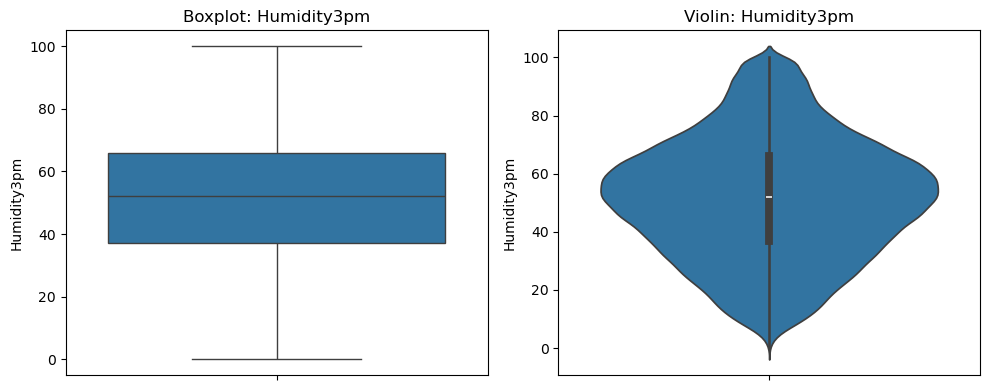

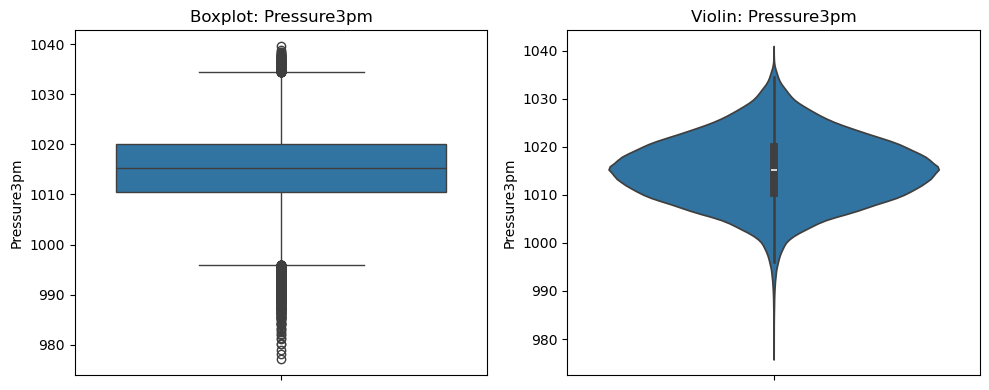

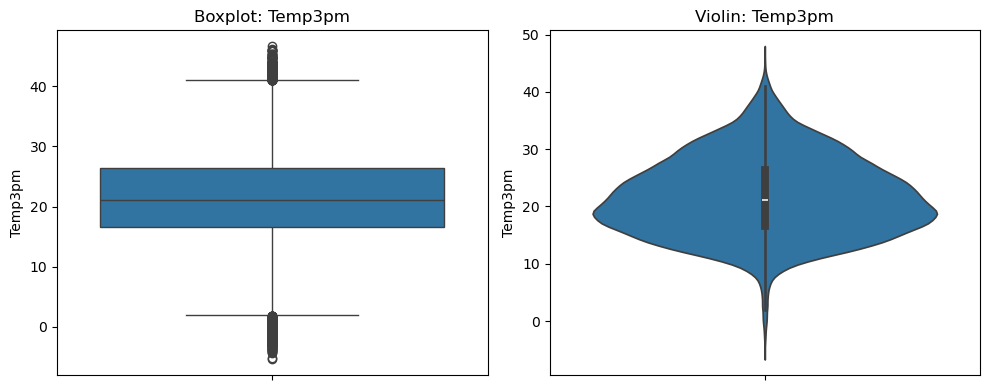

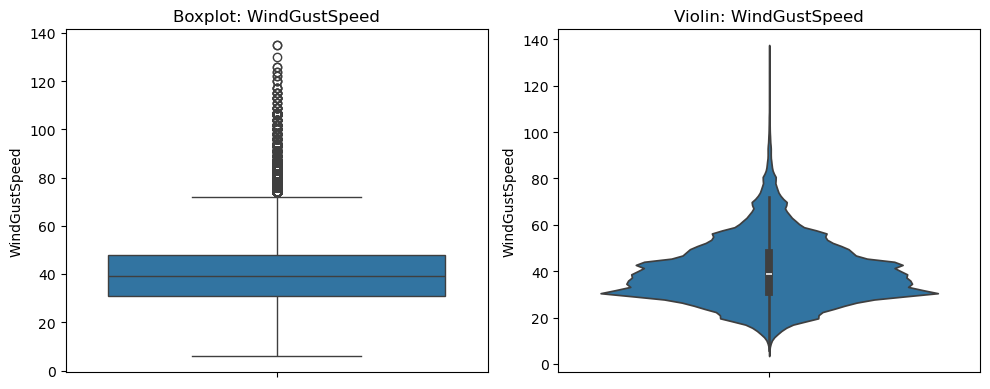

In [12]:
for col in [c for c in ['Rainfall','Humidity3pm','Pressure3pm','Temp3pm','WindGustSpeed'] if c in num_cols]:
    fig, axes = plt.subplots(1,2, figsize=(10,4))
    sns.boxplot(y=raw_df[col], ax=axes[0])
    axes[0].set_title(f'Boxplot: {col}')
    sns.violinplot(y=raw_df[col], ax=axes[1])
    axes[1].set_title(f'Violin: {col}')
    plt.tight_layout()
    plt.show()

In [13]:
# 1. Location vs Rainy Days (colored by RainToday)
fig1 = px.histogram(
    raw_df,
    x='Location',
    color='RainToday',
    title='Location vs. Rainy Days'
)
fig1.show()

fig2 = px.histogram(
    raw_df,
    x='RainTomorrow',
    color='RainToday',
    title='Rain Tomorrow vs Rain Today'
)
fig2.show()


In [14]:
raw_df.Location.nunique()

49

In [15]:
# List of 3pm weather features
features_3pm = ['Temp3pm', 'WindSpeed3pm', 'Cloud3pm', 'WindSpeed3pm', 'Pressure3pm']

for col in features_3pm:
    if col in raw_df.columns:
        fig = px.histogram(
            raw_df,
            x=col,
            color='RainTomorrow',
            title=f'{col} vs Rain Tomorrow',
            nbins=40
        )
        fig.show()

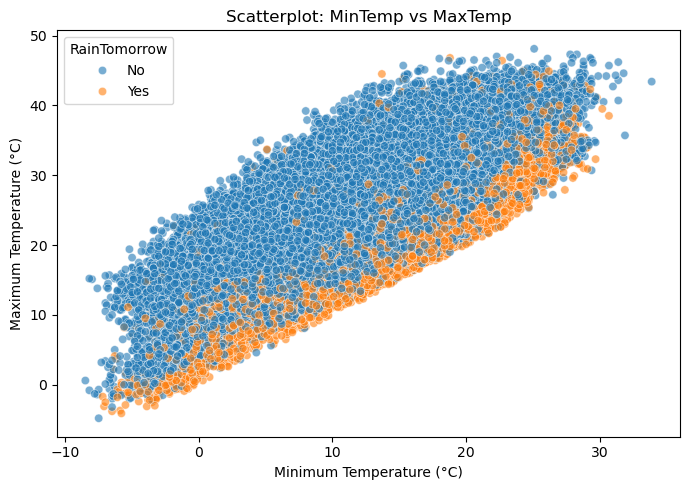

In [16]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    data=raw_df,
    x='MinTemp',
    y='MaxTemp',
    hue='RainTomorrow',  
    alpha=0.6             
)
plt.title('Scatterplot: MinTemp vs MaxTemp')
plt.xlabel('Minimum Temperature (°C)')
plt.ylabel('Maximum Temperature (°C)')
plt.tight_layout()
plt.show()

From the exploratory analysis of the Australian weather dataset, several important patterns emerged:

1. **Target Imbalance**  
   - The majority of days are dry, with only a smaller fraction being rainy.  
   - This confirms that the dataset is **imbalanced**, which should be addressed during modeling (e.g., stratified splits, resampling).

2. **Rainfall Distribution**  
   - Rainfall is highly **skewed**, with most days recording **0 mm**.  
   - A few extreme rainfall events exist, visible as strong outliers.

3. **Temperature Patterns**  
   - `MinTemp` and `MaxTemp` show a **strong positive correlation**.  
   - Rainy days are generally associated with **lower maximum temperatures**, suggesting cooler afternoons when it rains.

4. **Humidity and Pressure**  
   - **High Humidity at 3pm** strongly correlates with rain the following day.  
   - **Low Pressure at 3pm** is another strong indicator of rain, aligning with meteorological expectations.

5. **Categorical Variables**  
   - **RainToday** has a strong relationship with `RainTomorrow`: if it rains today, tomorrow is also more likely to be rainy.  
   - Certain **wind directions** are more often associated with rain (likely linked to coastal vs inland weather patterns).  
   - **Location** also matters: coastal cities tend to have more frequent rain compared to inland locations.

6. **Outliers & Extremes**  
   - Variables such as `Rainfall` and `WindGustSpeed` contain extreme values, reflecting occasional severe weather events.  
   - These are important for model robustness but may require treatment depending on the chosen algorithm.

---

### ✅ Overall Takeaways
- The **most informative predictors** for rain tomorrow are likely to be:
  - **Humidity3pm**,  
  - **Pressure3pm**, and  
  - **RainToday**,  
  with additional signal from wind direction and location.  
- There is strong potential for **feature engineering**, such as:
  - `TempRange = MaxTemp - MinTemp`,  
  - `PressureDiff = Pressure3pm - Pressure9am`,  
  - `HumidityDiff = Humidity3pm - Humidity9am`.  
- The dataset shows clear **climate-driven patterns**: rainy days tend to be cooler, more humid, and occur more often in coastal regions.

## 4) Training, Validation, and Test sets

### 4.1) Spliting Data

While building real-world machine learning models, it is quite common to split the dataset into three parts:

1. **Training set**  
   - Used to train the model (i.e., compute the loss and adjust the model's weights using an optimization technique).

2. **Validation set**  
   - Used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization, etc.), and pick the best version of the model.  
   - Picking a good validation set is essential for training models that generalize well.  

3. **Test set**  
   - Used to compare different models or approaches and report the model's final accuracy.  
   - For many datasets, test sets are provided separately.  
   - The test set should reflect the kind of data the model will encounter in the real world, as closely as feasible.

Since we are dealing with a time-series problem. I used historical data for my training set and future data for test set. Although it is not a perfect 60-20-20 split, I made sure that all the set contains data for all 12 months in a year to experience all the seasonality.

In [17]:
year = pd.to_datetime(raw_df.Date).dt.year

In [18]:
train_set = raw_df[year < 2015]
val_set = raw_df[year == 2015]
test_set = raw_df[year > 2015]

In [19]:
print('Train set shape:', train_set.shape)
print('Validation set shape:', val_set.shape)
print('Test set shape:', test_set.shape)

Train set shape: (97988, 23)
Validation set shape: (17089, 23)
Test set shape: (25710, 23)


In [20]:
train_set

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,2014-12-27,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,SSE,24.0,26.0,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No,No
144549,2014-12-28,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,SW,19.0,20.0,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No,No
144550,2014-12-29,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,SSE,26.0,9.0,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No,No
144551,2014-12-30,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,SSW,28.0,17.0,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No,No


In [21]:
val_set

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2133,2015-01-01,Albury,11.4,33.5,0.0,NaN,NaN,WSW,30.0,ESE,W,7.0,11.0,45.0,14.0,1013.5,1011.0,NaN,NaN,21.0,32.7,No,No
2134,2015-01-02,Albury,15.5,39.6,0.0,NaN,NaN,NE,56.0,ESE,ESE,9.0,9.0,45.0,12.0,1016.0,1012.4,NaN,NaN,25.6,38.2,No,No
2135,2015-01-03,Albury,17.1,38.3,0.0,NaN,NaN,NNE,48.0,NE,N,20.0,20.0,35.0,19.0,1017.9,1012.3,NaN,NaN,29.2,37.0,No,No
2136,2015-01-04,Albury,26.0,33.1,0.0,NaN,NaN,NNE,41.0,ESE,W,7.0,7.0,46.0,37.0,1013.6,1012.1,8.0,5.0,27.4,30.9,No,No
2137,2015-01-05,Albury,19.0,35.2,0.0,NaN,NaN,E,33.0,SSE,SE,7.0,9.0,60.0,34.0,1017.4,1014.7,8.0,NaN,25.6,32.5,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144913,2015-12-27,Uluru,20.5,34.7,0.0,NaN,NaN,E,52.0,ESE,E,35.0,20.0,23.0,12.0,1013.2,1010.1,NaN,NaN,24.3,33.0,No,No
144914,2015-12-28,Uluru,18.0,36.4,0.0,NaN,NaN,ESE,54.0,E,ESE,30.0,31.0,17.0,7.0,1014.7,1010.9,NaN,NaN,26.7,35.0,No,No
144915,2015-12-29,Uluru,17.5,37.1,0.0,NaN,NaN,E,56.0,E,SE,33.0,22.0,12.0,7.0,1012.6,1007.5,NaN,NaN,28.1,34.7,No,No
144916,2015-12-30,Uluru,20.0,38.9,0.0,NaN,NaN,E,59.0,E,SSE,20.0,17.0,12.0,12.0,1007.2,1002.6,NaN,1.0,31.3,38.4,No,No


In [22]:
test_set

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2498,2016-01-01,Albury,20.4,37.6,0.0,NaN,NaN,ENE,54.0,NaN,ESE,0.0,7.0,46.0,17.0,1013.4,1009.2,7.0,3.0,26.1,36.7,No,No
2499,2016-01-02,Albury,20.9,33.6,0.4,NaN,NaN,SSE,50.0,SSE,SE,9.0,17.0,54.0,30.0,1011.1,1008.4,8.0,8.0,24.8,31.7,No,Yes
2500,2016-01-03,Albury,18.4,23.1,2.2,NaN,NaN,ENE,48.0,ESE,ENE,11.0,39.0,62.0,67.0,1014.0,1014.8,8.0,8.0,21.8,19.5,Yes,Yes
2501,2016-01-04,Albury,17.3,23.7,15.6,NaN,NaN,SSE,39.0,SE,SSE,9.0,17.0,74.0,65.0,1017.9,1016.5,8.0,8.0,19.2,21.6,Yes,Yes
2502,2016-01-05,Albury,15.5,22.9,6.8,NaN,NaN,ENE,31.0,SE,SSE,6.0,9.0,92.0,63.0,1016.3,1013.9,8.0,8.0,17.2,22.2,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,15.0,13.0,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


### 4.2) Identifying input and target columns

In [23]:
input_cols = list(train_set.columns)[1:-1]
target_col = 'RainTomorrow'

In [24]:
print(input_cols)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


In [25]:
train_inputs = train_set[input_cols].copy()
train_target = train_set[target_col].copy()

In [26]:
val_inputs = val_set[input_cols].copy()
val_target = val_set[target_col].copy()


In [27]:
test_inputs = test_set[input_cols].copy()
test_target = test_set[target_col].copy()

In [28]:
numeric_cols = test_inputs.select_dtypes(include = np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [29]:
numeric_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [30]:
categorical_cols

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [31]:
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


In [32]:
train_inputs[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

### 4.3) Imputing Data


In [33]:
imputer = SimpleImputer(strategy='mean')

In [34]:
train_inputs[numeric_cols].isna().sum()

MinTemp            314
MaxTemp            187
Rainfall             0
Evaporation      36331
Sunshine         40046
WindGustSpeed     6828
WindSpeed9am       874
WindSpeed3pm      1069
Humidity9am       1052
Humidity3pm       1116
Pressure9am       9112
Pressure3pm       9131
Cloud9am         34988
Cloud3pm         36022
Temp9am            574
Temp3pm            596
dtype: int64

In [35]:
imputer.fit(raw_df[numeric_cols])

SimpleImputer()

In [36]:
list(imputer.statistics_)

[12.18482386562048,
 23.235120301822324,
 2.349974074310839,
 5.472515506887154,
 7.630539861047281,
 39.97051988882308,
 13.990496092519967,
 18.631140782316862,
 68.82683277087672,
 51.44928834695453,
 1017.6545771543717,
 1015.2579625879797,
 4.431160817585808,
 4.499250233195188,
 16.98706638787991,
 21.69318269001107]

In [37]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

## 5) Feature Scaling

### 5.1) Numeric feature scaling

In [38]:
scaler = MinMaxScaler()

In [39]:
scaler.fit(raw_df[numeric_cols])

MinMaxScaler()

In [40]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [41]:
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483689,0.525947,0.006396,0.036949,0.525366,0.265107,0.108395,0.215668,0.686309,0.514693,0.612014,0.608705,0.483192,0.493693,0.507089,0.517103
std,0.149458,0.131904,0.022962,0.021628,0.200931,0.102420,0.068800,0.101424,0.189008,0.206376,0.111335,0.106611,0.255486,0.238028,0.134722,0.130726
min,0.000000,0.013233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030400,0.000000,0.000000,0.027426,0.005758
25%,0.377358,0.429112,0.000000,0.026207,0.517241,0.193798,0.053846,0.149425,0.570000,0.370000,0.543802,0.540800,0.333333,0.333333,0.409283,0.422265
50%,0.478774,0.514178,0.000000,0.037741,0.526244,0.255814,0.100000,0.218391,0.690000,0.520000,0.614125,0.610527,0.492351,0.499917,0.502110,0.506718
75%,0.591981,0.618147,0.002156,0.038621,0.634483,0.310078,0.146154,0.275862,0.830000,0.650000,0.682645,0.675200,0.666667,0.666667,0.601266,0.604607
max,1.000000,1.000000,1.000000,0.568276,0.986207,1.000000,0.669231,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988484


### 5.2) Encoding Categorical Data

In [42]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown= 'ignore')

In [43]:
encoder.fit(raw_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [44]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 ar

In [45]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

In [46]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

In [47]:
test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
2498,Albury,0.681604,0.801512,0.000000,0.037741,0.526244,ENE,0.372093,NaN,ESE,0.000000,0.080460,0.46,0.17,0.543802,0.5136,0.777778,0.333333,0.702532,0.808061,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2499,Albury,0.693396,0.725898,0.001078,0.037741,0.526244,SSE,0.341085,SSE,SE,0.069231,0.195402,0.54,0.30,0.505785,0.5008,0.888889,0.888889,0.675105,0.712092,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2500,Albury,0.634434,0.527410,0.005930,0.037741,0.526244,ENE,0.325581,ESE,ENE,0.084615,0.448276,0.62,0.67,0.553719,0.6032,0.888889,0.888889,0.611814,0.477927,Yes,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2501,Albury,0.608491,0.538752,0.042049,0.037741,0.526244,SSE,0.255814,SE,SSE,0.069231,0.195402,0.74,0.65,0.618182,0.6304,0.888889,0.888889,0.556962,0.518234,Yes,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

### Saving data for future use

In [48]:
train_set.to_csv("data/train.csv", index=False)
val_set.to_csv("data/val.csv", index=False)
test_set.to_csv("data/test.csv", index=False)

## 5) Logistic Model Training

### 5.1) Model Building

In [49]:
model = LogisticRegression(solver = 'liblinear')

In [50]:
model.fit(train_inputs[numeric_cols + encoded_cols], train_target)

LogisticRegression(solver='liblinear')

In [51]:
print(model.coef_.tolist())

[[0.8986305979634677, -2.879918904902863, 3.162776274324581, 0.8542367531856732, -1.6713939166437324, 6.764392730488625, -0.9423171689349888, -1.4284264294487843, 0.3228983781450281, 5.995318015140624, 5.463849716968721, -9.176799553543413, -0.16230160214446931, 1.2876582927948164, 0.47471763710191006, 2.0214326395471667, 0.6016515225934831, -0.5524782508712989, 0.47814392061405986, 0.007666762238503626, 0.3468151103941778, -0.35227883537499255, 0.1797118331417109, 0.44048738818577504, -0.0139805413202247, 0.02894333415595456, 0.25814722123797046, -0.021207168164713124, -0.042792928342916675, -0.48314053918644906, -0.13756424365904205, -0.5760623508140023, -0.7875181919027927, -0.2554021198417564, -0.32888674891761505, -0.5690072856590153, 0.08182992988527826, 0.013382547354070089, 0.06412664336842125, -0.9020547760370422, -0.4443275589453155, 0.008519700250411731, -0.46061232020583864, -0.46551882061734723, -0.06950076988798, 0.1911584250684911, 0.4504771220179304, 0.6081205235945122,

In [52]:
print(model.intercept_)

[-2.44955433]


In [53]:
weight_df = pd.DataFrame(
    {'feature': (numeric_cols + encoded_cols),
    'weight': model.coef_.tolist()[0]
    }
)

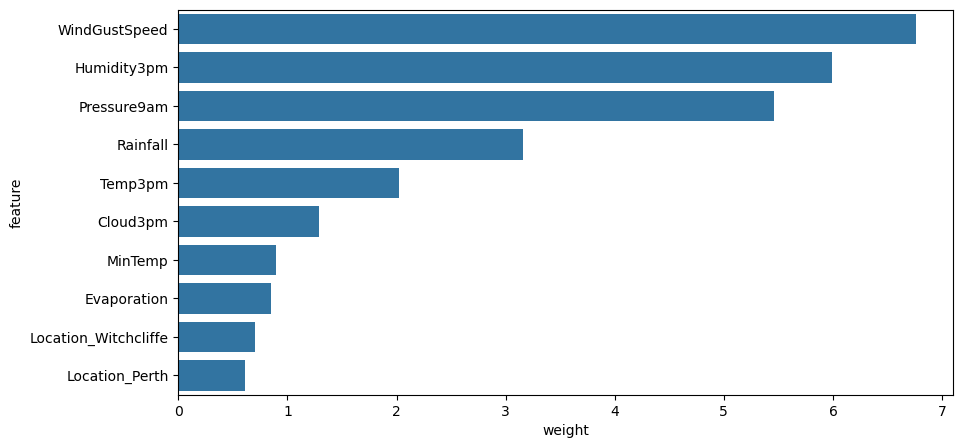

In [54]:
plt.figure(figsize = (10, 5))
sns.barplot(data= weight_df.sort_values('weight', ascending=False).head(10), x='weight', y='feature')
plt.show()

### 5.2) Making Predictions and Evaluating the Model

In [55]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [56]:
train_preds = model.predict(X_train)

In [57]:
train_preds

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [58]:
train_target

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 97988, dtype: object

In [59]:
train_prob = model.predict_proba(X_train)
train_prob

array([[0.94401096, 0.05598904],
       [0.94074143, 0.05925857],
       [0.96093601, 0.03906399],
       ...,
       [0.98749112, 0.01250888],
       [0.98334676, 0.01665324],
       [0.8745342 , 0.1254658 ]])

In [60]:
accuracy_score(train_preds,train_target)

0.8519206433440829

The model achieves an accuracy of **85.1%** on the training set.  
We can visualize the breakdown of correctly and incorrectly classified inputs using a **confusion matrix**:

| **Actual / Predicted** | **Negative (N)** | **Positive (P)** |
|-------------------------|------------------|------------------|
| **Negative (-)**        | **True Negatives (TN)** ✅  | **False Positives (FP)** ❌ (Type I error) |
| **Positive (+)**        | **False Negatives (FN)** ❌ (Type II error) | **True Positives (TP)** ✅ |

---

### 📌 Interpretation
- **True Positives (TP):** Model correctly predicts the positive class.  
- **True Negatives (TN):** Model correctly predicts the negative class.  
- **False Positives (FP):** Model incorrectly predicts positive when it is actually negative (**Type I error**).  
- **False Negatives (FN):** Model incorrectly predicts negative when it is actually positive (**Type II error**).

In [61]:
confusion_matrix(train_target, train_preds, normalize='true')

array([[0.94621341, 0.05378659],
       [0.4776585 , 0.5223415 ]])

In [62]:
def predict_and_plot(inputs, target, name=''):
    preds = model.predict(inputs)

    accuracy = accuracy_score(target,preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))

    cf = confusion_matrix(target, preds, normalize = 'true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name))
    plt.show();

    return preds

Accuracy: 85.19%


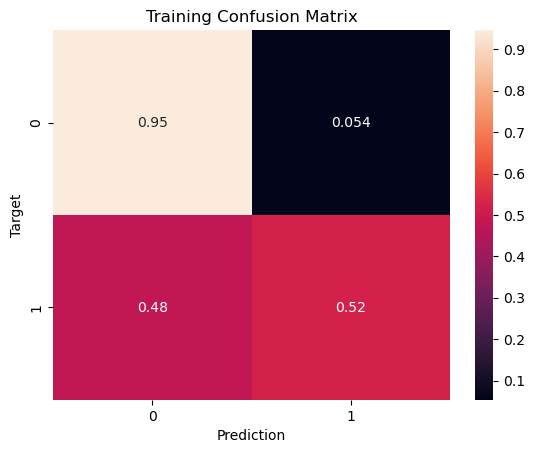

In [63]:
train_preds = predict_and_plot(X_train, train_target, 'Training')

Accuracy: 85.40%


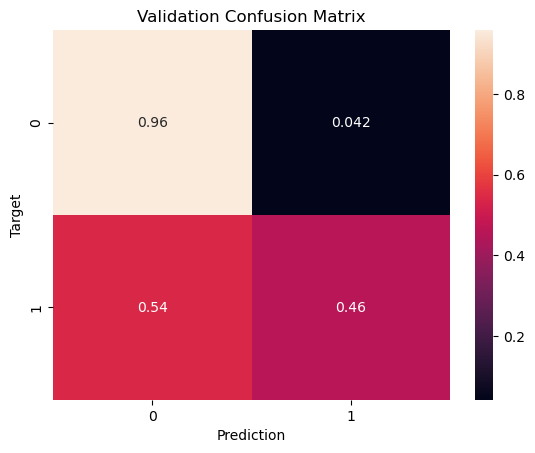

In [64]:
val_preds = predict_and_plot(X_val, val_target, 'Validation')

Accuracy: 84.20%


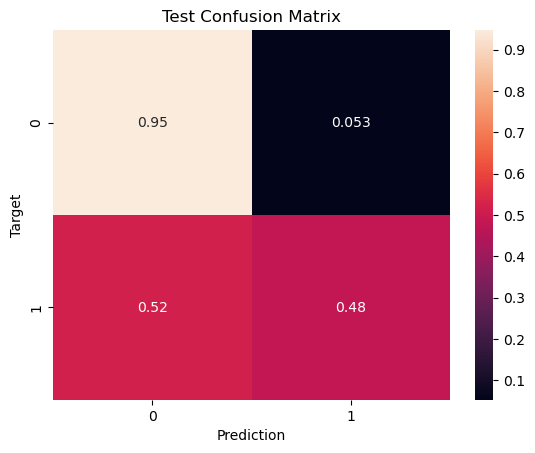

In [65]:
test_preds = predict_and_plot(X_test, test_target, 'Test')

The accuracy of the model on the test set is above 84%, lets benchmark this against some baseline models. 

In [66]:
def random_guess(inputs):
    return np.random.choice(['No', 'Yes'], len(inputs))

def all_no(inputs):
    return np.full(len(inputs), "No")

In [67]:
accuracy_score(test_target, random_guess(X_test))

0.4999222092570984

In [68]:
accuracy_score(test_target, all_no(X_test))

0.7734344612991054

### 5.3) Making Prediction on a Single Input 

In [69]:
new_input = {
    'Date': '2021-06-19',
    'Location': 'Katherine',
    'MinTemp': 23.2,
    'MaxTemp': 33.2,
    'Rainfall': 10.2,
    'Evaporation': 4.2,
    'Sunshine': np.nan,
    'WindGustDir': 'NNW',
    'WindGustSpeed': 52.0,
    'WindDir9am': 'NW',
    'WindDir3pm': 'NNE',
    'WindSpeed9am': 13.0,
    'WindSpeed3pm': 20.0,
    'Humidity9am': 89.0,
    'Humidity3pm': 58.0,
    'Pressure9am': 1004.8,
    'Pressure3pm': 1001.5,
    'Cloud9am': 8.0,
    'Cloud3pm': 5.0,
    'Temp9am': 25.7,
    'Temp3pm': 33.0,
    'RainToday': 'Yes'
}

In [70]:
new_input_df = pd.DataFrame([new_input])

In [71]:
new_input_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2021-06-19,Katherine,23.2,33.2,10.2,4.2,NaN,NNW,52.0,NW,NNE,13.0,20.0,89.0,58.0,1004.8,1001.5,8.0,5.0,25.7,33.0,Yes


We've now created a Pandas dataframe with the same columns as `raw_df` (except `RainTomorrow`, which needs to be predicted). The dataframe contains just one row of data, containing the given input.

We must now apply the same transformations applied while training the model:

1. **Imputation of missing values** using the `imputer` created earlier  
2. **Scaling numerical features** using the `scaler` created earlier  
3. **Encoding categorical features** using the `encoder` created earlier

In [72]:
new_input_df[numeric_cols] = imputer.transform(new_input_df[numeric_cols])
new_input_df[numeric_cols] = scaler.transform(new_input_df[numeric_cols])
new_input_df[encoded_cols] = encoder.transform(new_input_df[categorical_cols])



C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\3350149363.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\3350149363.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\3350149363.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

In [73]:
X_new_input = new_input_df[numeric_cols + encoded_cols]
X_new_input

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,0.747642,0.718336,0.027493,0.028966,0.526244,0.356589,0.1,0.229885,0.89,0.58,0.401653,0.3904,0.888889,0.555556,0.694093,0.737044,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [74]:
prediction = model.predict(X_new_input)[0]
prediction

'Yes'

In [75]:
prob = model.predict_proba(X_new_input)[0]
prob

array([0.48102368, 0.51897632])

In [76]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numeric_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

In [77]:
new_input = {
    'Date': '2021-06-19',
    'Location': 'Launceston',
    'MinTemp': 23.2,
    'MaxTemp': 33.2,
    'Rainfall': 10.2,
    'Evaporation': 4.2,
    'Sunshine': np.nan,
    'WindGustDir': 'NNW',
    'WindGustSpeed': 52.0,
    'WindDir9am': 'NW',
    'WindDir3pm': 'NNE',
    'WindSpeed9am': 13.0,
    'WindSpeed3pm': 20.0,
    'Humidity9am': 89.0,
    'Humidity3pm': 58.0,
    'Pressure9am': 1004.8,
    'Pressure3pm': 1001.5,
    'Cloud9am': 8.0,
    'Cloud3pm': 5.0,
    'Temp9am': 25.7,
    'Temp3pm': 33.0,
    'RainToday': 'Yes'
}

In [78]:
predict_input(new_input)

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\2435838903.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\2435838903.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_27240\2435838903.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

('Yes', 0.6474976391711854)

In [79]:
import joblib

aussie_rain = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_col,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [80]:
joblib.dump(aussie_rain, 'aussie_rain.joblib')

['aussie_rain.joblib']

## 📌 Summary & Insights

### ✅ What We Did
1. **Data Preparation**
   - Loaded the weather dataset and performed initial cleaning.  
   - Identified **numerical** and **categorical** features, along with the **target column** (`RainTomorrow`).  
   - Split the data into training, validation, and test sets.

2. **Baseline Models**
   - Implemented simple baseline predictors:  
     - `random_guess`: randomly predicts "Yes" or "No".  
     - `all_no`: always predicts "No" (majority class baseline).  
   - These provided benchmarks for evaluating whether our logistic regression model adds real predictive value.

3. **Preprocessing Pipelines**
   - Applied transformations to the data:  
     - **Imputation** for missing values.  
     - **Scaling** of numerical features.  
     - **Encoding** of categorical variables.  

4. **Model Training**
   - Trained a **Logistic Regression model** on the processed data.  
   - Evaluated performance using accuracy and probability outputs.

5. **Saving Artifacts**
   - Saved the trained model, preprocessing objects (imputer, scaler, encoder), and column metadata for **future use** with `joblib`.

6. **Single Input Prediction**
   - Created custom dictionaries (`new_input`) to simulate new daily weather records.  
   - Applied preprocessing and generated predictions + probabilities for unseen inputs.

---

### 🔑 Key Findings
- The **random baseline** achieved ~50% accuracy (balanced guess).  
- The **“always No” baseline** achieved ~77% accuracy, reflecting dataset imbalance toward "No Rain".  
- Our **Logistic Regression model** reached **~85% accuracy**, significantly outperforming both baselines.  
- Predictions on new inputs produced **reasonable and interpretable outputs**, with probability estimates showing the model’s confidence.  
- The workflow is now **fully reusable**: we can save and load the model with its preprocessing steps, ensuring consistent predictions in future sessions.

---

📊 **Insight:**  
The project demonstrates that even a simple **Logistic Regression** model, when paired with proper preprocessing, can effectively handle imbalanced weather data and provide meaningful predictions. The setup with saved artifacts makes it ready for **deployment or integration** into a real-world application.